# Semantic Segmentation of Drone Aerial Images using Deep Learning Models

In this notebook we will present an implmentation of a deep learning model for semantic segmentation of drone aerial images. The dataset used is the [Semantic Drone Dataset](https://www.tugraz.at/index.php?id=22387) which contains images of urban areas taken from drones.

Enrico Maria Aldorasi, Emanuele Frasca

# Environment Setup

In this section, we will set up the environment for the project and define the necessary constants and paths.

## Libraries Installation

This cell is used to install required libraries on your environment excluding the most used ones.

In [ ]:
!pip install kaggle -q
!pip install gradio -q
!pip install segmentation_models_pytorch -q
!pip install scikit-learn -q

## Libraries loading

In [2]:
print("Importing libraries...")
import os
import random
import shutil
import torch
import gc
import ssl
try:
    import kaggle
except:
    print("Kaggle API not detected in user environment. Set the Kaggle API key and username in the cell above.")

import pandas as pd
import numpy as np
import gradio as gr
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp

import torch.nn as nn
import torch.optim as optim

from PIL import Image
from tqdm.notebook import tqdm
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF
from concurrent.futures import ThreadPoolExecutor
from sklearn.model_selection import train_test_split
print("Finished Importing")

Importing libraries...
Kaggle API not detected in user environment. Set the Kaggle API key and username in the cell above.
Finished Importing


## Constants definition

In [3]:
# PARAMETERS DEFINITION

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

torch.set_printoptions(edgeitems=10)                                    # Set how many elements do the print(tensor) show
ssl._create_default_https_context = ssl._create_unverified_context      # Set ssl context as unverified to avoid SSL errors
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")   # Set compute device to GPU if available, else to CPU

resize_images = False                                                    # Set to True if you want to resize the images to the specified dimensions
download_dataset_from_kaggle = False                                     # Set to True if you want to download the dataset from Kaggle API required
resize_dimensions = (512, 512)                                           # Set the dimensions to resize the images to


# Set Kaggle API key and username
os.environ['KAGGLE_USERNAME'] = 'emanuelefrasca'
os.environ['KAGGLE_KEY'] = '1f63bdaaf70e2b4a8995867d78a23d82'

if download_dataset_from_kaggle:
    print("Downloading dataset from Kaggle...")
    os.system('kaggle datasets download -d bulentsiyah/semantic-drone-dataset -p "kaggle/input/"')
    print("Finished Downloading")

    print("Unzipping dataset...")
    shutil.unpack_archive("kaggle/input/semantic-drone-dataset.zip", "kaggle/input/semantic-drone-dataset")
    print("Finished Unzipping")


# PATHS DEFINITION

# Original dataset paths of (6000x4000 images)
original_images_path = "kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images"
original_segmentated_rgb_images_path = "kaggle/input/semantic-drone-dataset/RGB_color_image_masks/RGB_color_image_masks"
original_segmentated_images_path = "kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic"

# Reduced size dataset paths (512x512 images)
reduced_images_path = "kaggle/working/original_images"
reduced_segmentated_rgb_images_path = "kaggle/working/segmentated_rgb_images"
reduced_segmentated_images_path = "kaggle/working/segmentated_images"

# CSV file path of images pairs
class_dict_path = "kaggle/input/semantic-drone-dataset/class_dict_seg.csv"

# Data Preprocessing
In this section, we will prepare the dataset for the semantic segmentation task. We will load the dataset, preprocess the images, and split the dataset into training and validation sets.

## Resize Dataset Images Function

In [4]:
# Function to resize a single image
def resize_image(input_output_path_tuple, new_width, new_height, interpolation=Image.LANCZOS):
    input_path, output_path = input_output_path_tuple
    # If the file is an image
    if os.path.isfile(input_path) and input_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Open and resize the image
        with Image.open(input_path) as img:
            resized_img = img.resize((new_width, new_height), interpolation)
            resized_img.save(output_path)
    else:
        print(f"Skipped {input_path} as it is not an image.")

# Function to resize all images in a folder
def resize_images_in_folder(input_folder, output_folder, new_width, new_height, interpolation=Image.NEAREST):
    # Create output folder
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # List of input and output paths
    input_output_paths = [(os.path.join(input_folder, filename), os.path.join(output_folder, filename)) for filename in os.listdir(input_folder)]

    # Use ThreadPoolExecutor to parallelize the resizing process
    with ThreadPoolExecutor() as executor:
        list(tqdm(executor.map(lambda p: resize_image(p, new_width, new_height, interpolation), input_output_paths), total=len(input_output_paths)))

# Resize images if needed
if resize_images:
    print("Resizing original images...")
    resize_images_in_folder(original_images_path, "kaggle/working/original_images", resize_dimensions[0], resize_dimensions[1], Image.NEAREST)
    print("Resizing rgb segmented images...")
    resize_images_in_folder(original_segmentated_rgb_images_path, "kaggle/working/segmentated_rgb_images", resize_dimensions[0], resize_dimensions[1], Image.NEAREST)
    print("Resizing grayscale segmented images...")
    resize_images_in_folder(original_segmentated_images_path, "kaggle/working/segmentated_images", resize_dimensions[0], resize_dimensions[1], Image.NEAREST)

    # Create a zip archive of the resized images
    shutil.make_archive("resized_images", 'zip', "kaggle/working/")

## Load Dataset Paths using Pandas DataFrame

In [5]:
# Create df dataset from the original images folder and the segmented images folder
def create_dataset_and_load_class_dict(original_images_path, segmented_images_path, segmented_rgb_images_path, class_dict_path):
    df = pd.DataFrame(columns=["image_path", "label_path", "rgb_label_path"])

    row_list = []
    for root, dirs, files in os.walk(original_images_path):
        for file in files:
            if file.endswith((".jpg", ".png")):
                # Create a dictionary with the image path and the label path
                image_path = os.path.join(original_images_path, file)
                label_file = file.replace(".jpg", ".png")
                label_path = os.path.join(segmented_images_path, label_file)
                rgb_label_path = os.path.join(segmented_rgb_images_path, label_file)

                row_list.append({"image_path": image_path, "label_path": label_path, "rgb_label_path": rgb_label_path})

    df = pd.DataFrame(row_list)

    # Load classes dictionary
    df_classes = pd.read_csv(class_dict_path)

    return df, df_classes

# Create dataframe of images paths
df, df_classes = create_dataset_and_load_class_dict(reduced_images_path, reduced_segmentated_images_path, reduced_segmentated_rgb_images_path, class_dict_path)

# Display the first few rows of the dataframe
print("Dataset DataFrame:")
display(df.head())

# Display class dictionary
#print("\nClasses Dictionary:")
#display(df_classes)

Dataset DataFrame:


,image_path,label_path,rgb_label_path
0,kaggle/working/original_images/015.jpg,kaggle/working/segmentated_images/015.png,kaggle/working/segmentated_rgb_images/015.png
1,kaggle/working/original_images/000.jpg,kaggle/working/segmentated_images/000.png,kaggle/working/segmentated_rgb_images/000.png
2,kaggle/working/original_images/021.jpg,kaggle/working/segmentated_images/021.png,kaggle/working/segmentated_rgb_images/021.png
3,kaggle/working/original_images/035.jpg,kaggle/working/segmentated_images/035.png,kaggle/working/segmentated_rgb_images/035.png
4,kaggle/working/original_images/026.jpg,kaggle/working/segmentated_images/026.png,kaggle/working/segmentated_rgb_images/026.png


## Original Dataset Samples Visualization

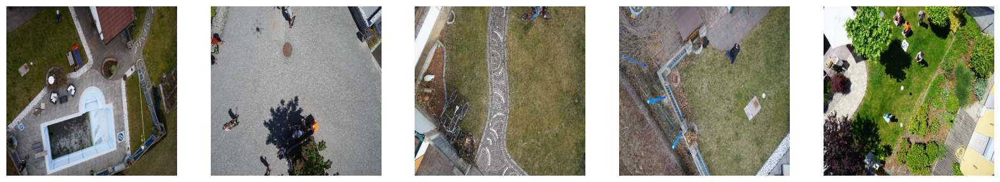

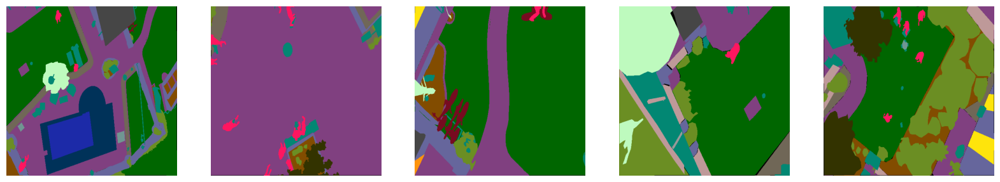

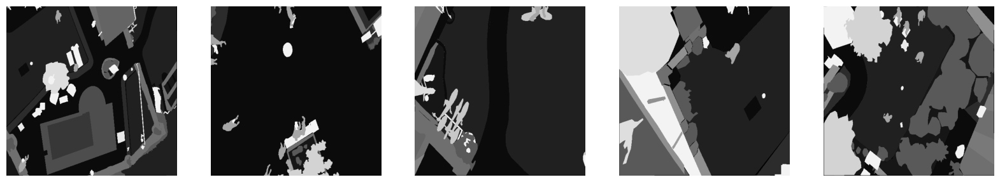

In [6]:
# Display some sample images and labels directly from the original dataset
def display_samples(dataframe, column, num_samples=5, title="Samples"):
    list_len = []
    plt.figure(figsize=(20, 10))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        img = Image.open(dataframe[column][i])
        #print(np.array(img))
        list_len.append(len(np.unique(img)))
        plt.imshow(img, cmap="gray",  vmin=0, vmax=23)
        plt.axis('off')
    #plt.title(title)
    #print(max(list_len))
    plt.show()

# Display sample images
display_samples(df, 'image_path', title="Sample Images")
# Display sample RGB labels
display_samples(df, 'rgb_label_path', title="Sample RGB Labels")
# Display sample labels
display_samples(df, 'label_path', title="Sample Labels")

## Dataset Class Definition

In [7]:
# Create Dataset class
class DroneDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_path = self.df.iloc[idx, 0]
        label_path = self.df.iloc[idx, 1]

        image = Image.open(image_path)
        label = Image.open(label_path)

        if self.transform:
            image, label = self.transform(image, label)

        label = (1 + (label - label.min()) * (23 - 1) / (label.max() - label.min())).long()

        return image, label

## Data Augmentation Function

In [8]:
# Data augmentation class
class CombinedTransform:
    def __init__(self, augment=True, mean=None, std=None):
        self.augment = augment
        self.mean = mean
        self.std = std

    def __call__(self, image, mask):
        if self.augment:
            if random.random() > 0.5:
                image = TF.hflip(image)
                mask = TF.hflip(mask)
            if random.random() > 0.5:
                image = TF.vflip(image)
                mask = TF.vflip(mask)
            if random.random() > 0.5:
                angle = random.uniform(-30, 30)
                image = TF.rotate(image, angle, interpolation=TF.InterpolationMode.NEAREST)
                mask = TF.rotate(mask, angle, interpolation=TF.InterpolationMode.NEAREST)
            if random.random() > 0.5:
                image = TF.adjust_brightness(image, brightness_factor=random.uniform(0.7, 1.3))
            if random.random() > 0.5:
                image = TF.adjust_contrast(image, contrast_factor=random.uniform(0.7, 1.3))


        if not self.augment:
            image = TF.resize(image, (512, 512), interpolation=TF.InterpolationMode.NEAREST)
            mask = TF.resize(mask, (512, 512), interpolation=TF.InterpolationMode.NEAREST)

            image = TF.to_tensor(image).float()
            mask = TF.to_tensor(mask).float()

            if self.mean is not None and self.std is not None:
                image = TF.normalize(image, mean=self.mean, std=self.std)

            return image, mask

        image = TF.resize(image, (512, 512), interpolation=TF.InterpolationMode.NEAREST)
        mask = TF.resize(mask, (512, 512), interpolation=TF.InterpolationMode.NEAREST)

        image = TF.to_tensor(image).float()
        mask = TF.to_tensor(mask).float()

        if self.mean is not None and self.std is not None:
            image = TF.normalize(image, mean=self.mean, std=self.std)

        return image, mask

## Mean and Standard Deviation Calculation

In [9]:
# Compute mean and standard deviation on original dataset
def compute_mean_std(train_df, dataset_class, transform_class, batch_size=16):
    # Use the transformation without augmentation and normalization
    original_transform = transform_class(augment=False, mean=None, std=None)
    original_dataset = dataset_class(train_df, transform=original_transform)
    original_dataloader = DataLoader(original_dataset, batch_size=batch_size, shuffle=False)

    mean = torch.zeros(3)
    std = torch.zeros(3)
    n_samples = 0

    for images, _ in original_dataloader:
        images = images.float()  # Ensure the images are in float type
        batch_samples = images.size(0)  # batch size (the last batch can have smaller size)
        images = images.view(batch_samples, images.size(1), -1)
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)
        n_samples += batch_samples
        break

    mean /= n_samples
    std /= n_samples

    return mean, std

## Dataset split

In [27]:
# Split the dataset dataframe into train, validation, and test sets
train_df, test_df = train_test_split(df, test_size=0.1)
train_df, val_df = train_test_split(train_df, test_size=0.1)
print("Train size:", len(train_df))
print("Validation size:", len(val_df))
print("Test size:", len(test_df))

# Compute mean and std
mean, std = compute_mean_std(train_df, DroneDataset, CombinedTransform)
print(f'Mean: {mean}, Std: {std}')

#Define the transformation with augmentation and normalization
train_transform = CombinedTransform(augment=True, mean=mean, std=std)
val_test_transform = CombinedTransform(augment=False, mean=mean, std=std)

# Create datasets
train_dataset = DroneDataset(train_df, transform=train_transform)
val_dataset = DroneDataset(val_df, transform=val_test_transform)
test_dataset = DroneDataset(test_df, transform=val_test_transform)

# Create dataloaders
batch_size = 4
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

Train size: 324
Validation size: 36
Test size: 40
Mean: tensor([0.4594, 0.4602, 0.4136]), Std: tensor([0.1875, 0.1824, 0.1951])


## Modified Dataset Samples Visualization

This code is used to visualize some samples of the modified dataset after the data augmentation process.

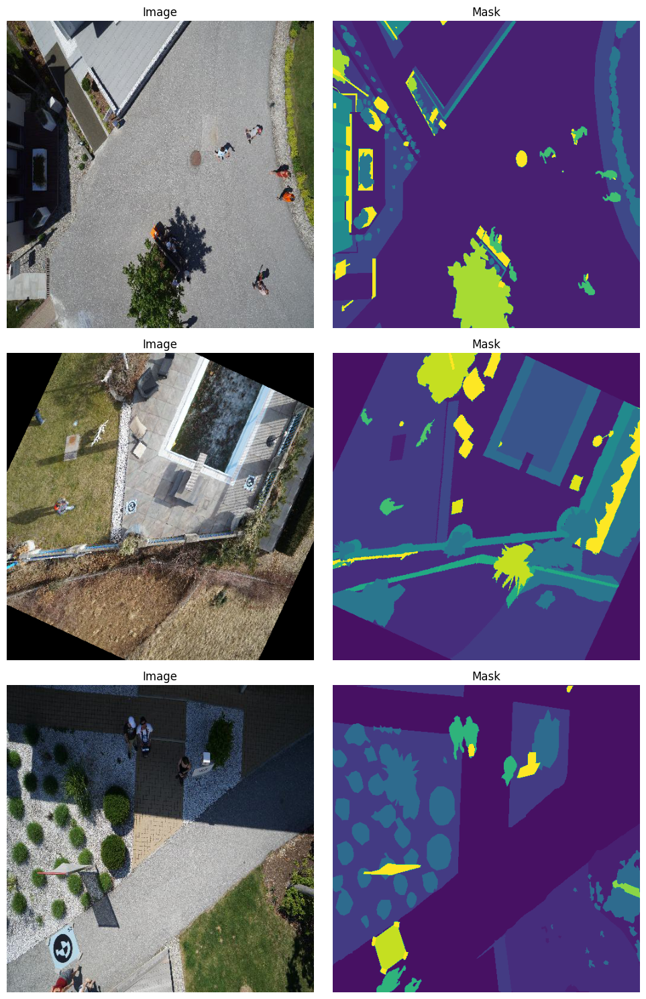

In [28]:
def denormalize_image(image, mean, std):
    # Ensure mean and std are numpy arrays
    mean = np.array(mean)
    std = np.array(std)

    # Denormalize the image
    image = image * std + mean

    # Clip the image to the valid range [0, 255] and normalize to [0, 1] for display
    image = np.clip(image, 0, 1)

    return image

# Displays images from the da
def display_samples_from_dataloader(dataloader, num_samples=30, mean=None, std=None):
    # Retrieve a batch of data
    for images, masks in dataloader:

        # Select a subset of samples
        images = images[:num_samples]
        masks = masks[:num_samples]

        # Create a subplot
        fig, axs = plt.subplots(num_samples, 2, figsize=(10, num_samples * 5))

        for i in range(num_samples):
            # Convert tensor to numpy for visualization
            image = images[i].permute(1, 2, 0).numpy()
            mask = masks[i].permute(1, 2, 0).numpy()

            #print(max(np.unique(mask)))


            # Denormalize image if necessary
            if mean is not None and std is not None:
                image = denormalize_image(image, mean, std)

            # Display the image
            axs[i, 0].imshow(image)
            axs[i, 0].set_title("Image")
            axs[i, 0].axis('off')

            # Display the mask
            axs[i, 1].imshow(mask,  vmin=0, vmax=23)
            axs[i, 1].set_title("Mask")
            axs[i, 1].axis('off')

        plt.tight_layout()
        plt.show()
        break

display_samples_from_dataloader(train_dataloader, num_samples=3, mean=mean, std=std)

# Models Definition

## Model 1 - FCN (Fully Convolutional Network)

In [29]:
class SimpleFCN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleFCN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            #nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            #nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.classifier = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            #nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, num_classes, kernel_size=1),
            #nn.BatchNorm2d(num_classes),
            nn.Upsample(scale_factor=4, mode='bilinear', align_corners=True)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# Model Training

In this section, we will train the models on the given dataset.

## Trainer Class

In [31]:
class Trainer:
    def __init__(self, model, train_dataloader, val_dataloader, test_dataloader, lr, patience=20, num_classes=24):
        # Dataloaders
        self.train_dataloader = train_dataloader
        self.val_dataloader = val_dataloader
        self.test_dataloader = test_dataloader

        # Device, model, optimizer, criterion
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = model.to(self.device)
        self.optimizer = optim.AdamW(self.model.parameters(), lr=lr)
        self.criterion = smp.losses.JaccardLoss(mode='multiclass')
        #self.criterion = nn.CrossEntropyLoss()

        # Early stopping
        self.patience = patience
        self.best_val_loss = float('inf')
        self.epochs_no_improve = 0
        self.num_classes = num_classes
        self.best_model_state = None

        # Store metrics for plotting
        self.epoch = 0
        self.train_losses = []
        self.val_losses = []
        self.pixel_accuracies = []
        self.mean_iou_scores = []
        self.class_iou_scores = []
        
        self.lr = lr

    def train(self, epochs):
        gc.collect()
        torch.cuda.empty_cache()

        for epoch in range(epochs):
            self.model.train()

            self.epoch += 1
            running_loss = 0

            for i, (images, labels) in tqdm(enumerate(self.train_dataloader), total=len(self.train_dataloader)):
                images = images.to(self.device)
                labels = labels.to(self.device).squeeze(1).long()

                self.optimizer.zero_grad()

                outputs = self.model(images)

                loss = self.criterion(outputs, labels)
                loss.backward()

                self.optimizer.step()

                running_loss += loss.item()

            # Append train loss
            self.train_losses.append(running_loss / len(self.train_dataloader))

            # Calculate validation loss and metrics
            val_loss, val_pixel_acc, val_mean_iou, class_iou = self.evaluate(self.val_dataloader)
            self.val_losses.append(val_loss)
            self.pixel_accuracies.append(val_pixel_acc)
            self.mean_iou_scores.append(val_mean_iou)
            self.class_iou_scores.append(class_iou)

            # Print metrics
            print(f"Epoch {self.epoch} - Train Loss: {self.train_losses[-1]}, Validation Loss: {val_loss}, "
                  f"Pixel-wise Accuracy: {val_pixel_acc}, Mean IoU: {val_mean_iou}")

            #if epoch % 15 == 0 and epoch != 0:
            #    self.plot_metrics(epoch+1)

            # Early stopping
            if val_loss < self.best_val_loss:
                self.best_val_loss = val_loss
                self.epochs_no_improve = 0
                self.best_model_state = self.model.state_dict()
            else:
                self.epochs_no_improve += 1
                print(f"Validation loss has not improved for {self.epochs_no_improve} epochs")
                if self.epochs_no_improve == self.patience:
                    print("Early stopping!")
                    break

        # Load best model state
        self.model.load_state_dict(self.best_model_state)
        self.plot_metrics()

    def evaluate(self, dataloader):
        self.model.eval()

        running_loss, total_correct_pixels, total_pixels = 0, 0, 0
        intersection = torch.zeros(self.num_classes)
        union = torch.zeros(self.num_classes)

        with torch.no_grad():
            for images, labels in dataloader:
                images = images.to(self.device)
                labels = labels.to(self.device).squeeze(1).long()

                outputs = self.model(images)
                loss = self.criterion(outputs, labels)
                running_loss += loss.item()

                # Calculate pixel-wise accuracy
                _, predicted = torch.max(outputs, 1)
                total_correct_pixels += (predicted == labels).sum().item()
                total_pixels += labels.numel()

                # Calculate IoU
                for cls in range(self.num_classes):
                    class_labels = (labels == cls)
                    class_preds = (predicted == cls)
                    intersection[cls] += torch.logical_and(class_labels, class_preds).sum().item()
                    union[cls] += torch.logical_or(class_labels, class_preds).sum().item()

        loss = running_loss / len(dataloader)
        pixel_accuracy = total_correct_pixels / total_pixels

        # Handle division by zero for IoU calculation
        union[union == 0] = 1
        class_iou = intersection / union
        mean_iou = torch.mean(class_iou).item()

        return loss, pixel_accuracy, mean_iou, class_iou

    def test(self):
        test_loss, test_pixel_acc, test_mean_iou, class_iou = self.evaluate(self.test_dataloader)

        print(f"Test Loss: {test_loss}")
        print(f"Pixel-wise Accuracy: {test_pixel_acc}")
        print(f"Mean IoU: {test_mean_iou}")
        for cls in range(self.num_classes):
            print(f"IoU for class {cls}: {class_iou[cls].item()}")
        return test_loss, test_pixel_acc, test_mean_iou, class_iou

    def plot_metrics(self):
        plt.figure(figsize=(12, 8))

        self.epoch += 1

        # Plot Loss
        plt.subplot(2, 2, 1)
        plt.plot(range(1, self.epoch), self.train_losses, label='Train Loss')
        plt.plot(range(1, self.epoch), self.val_losses, label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()

        # Plot Pixel-wise Accuracy
        plt.subplot(2, 2, 2)
        plt.plot(range(1, self.epoch), self.pixel_accuracies, label='Pixel-wise Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.title('Pixel-wise Accuracy')
        plt.legend()

        # Plot Mean IoU
        plt.subplot(2, 2, 3)
        plt.plot(range(1, self.epoch), self.mean_iou_scores, label='Mean IoU')
        plt.xlabel('Epoch')
        plt.ylabel('IoU')
        plt.title('Mean IoU')
        plt.legend()

        # Plot Class-wise IoU
        plt.subplot(2, 2, 4)
        class_iou_scores_np = torch.stack(self.class_iou_scores).numpy()
        for cls in range(self.num_classes):
            plt.plot(range(1, self.epoch), class_iou_scores_np[:, cls], label=f'Class {cls} IoU')
        plt.xlabel('Epoch')
        plt.ylabel('IoU')
        plt.title('Class-wise IoU')
        #plt.legend()

        plt.tight_layout()
        plt.show()

## Models List

In [50]:
# Models dictionaries
models = {
    'SimpleFCN': SimpleFCN(24), # Baseline
    'FPN': smp.FPN(encoder_name="efficientnet-b3", encoder_weights="imagenet", in_channels=3, classes=24), # Good performance
    'DeepLabV3Plus': smp.DeepLabV3Plus(encoder_name="efficientnet-b3", encoder_weights="imagenet", in_channels=3, classes=24) # Best performance          
}

## Training Loop

Training SimpleFCN...


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 1 - Train Loss: 0.782271444061656, Validation Loss: 0.7696505188941956, Pixel-wise Accuracy: 0.3383299509684245, Mean IoU: 0.038755644112825394


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 2 - Train Loss: 0.7492775240062196, Validation Loss: 0.7564343876308866, Pixel-wise Accuracy: 0.4432684580485026, Mean IoU: 0.05376981571316719


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 3 - Train Loss: 0.7415714330143399, Validation Loss: 0.7487423949771457, Pixel-wise Accuracy: 0.4705563651190864, Mean IoU: 0.05993282422423363


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 4 - Train Loss: 0.7199375151116171, Validation Loss: 0.7434685362709893, Pixel-wise Accuracy: 0.4393463134765625, Mean IoU: 0.06545806676149368


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 5 - Train Loss: 0.7164232281990993, Validation Loss: 0.7385632793108622, Pixel-wise Accuracy: 0.45656988355848527, Mean IoU: 0.07325827330350876


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 6 - Train Loss: 0.7133064409832895, Validation Loss: 0.7351006004545424, Pixel-wise Accuracy: 0.47033394707573783, Mean IoU: 0.07900752127170563


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 7 - Train Loss: 0.706382871777923, Validation Loss: 0.7342260479927063, Pixel-wise Accuracy: 0.441500981648763, Mean IoU: 0.07789535820484161


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 8 - Train Loss: 0.7044023069334618, Validation Loss: 0.7297122478485107, Pixel-wise Accuracy: 0.45165877872043186, Mean IoU: 0.08350243419408798


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 9 - Train Loss: 0.7066189536341915, Validation Loss: 0.7309315933121575, Pixel-wise Accuracy: 0.44451904296875, Mean IoU: 0.07899781316518784
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 10 - Train Loss: 0.6992899374461469, Validation Loss: 0.7263657649358114, Pixel-wise Accuracy: 0.4921772215101454, Mean IoU: 0.08999031782150269


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 11 - Train Loss: 0.6982234734811901, Validation Loss: 0.7257679833306206, Pixel-wise Accuracy: 0.4607745276557075, Mean IoU: 0.08935867995023727


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 12 - Train Loss: 0.7050174908873476, Validation Loss: 0.7234254545635648, Pixel-wise Accuracy: 0.49591488308376735, Mean IoU: 0.09774776548147202


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 13 - Train Loss: 0.684442968648157, Validation Loss: 0.7215968171755472, Pixel-wise Accuracy: 0.5085691875881619, Mean IoU: 0.09891625493764877


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 14 - Train Loss: 0.7063572701112724, Validation Loss: 0.7195774912834167, Pixel-wise Accuracy: 0.5149789386325412, Mean IoU: 0.1005282923579216


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 15 - Train Loss: 0.6986156518076673, Validation Loss: 0.7222640977965461, Pixel-wise Accuracy: 0.4720129436916775, Mean IoU: 0.09666842967271805
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 16 - Train Loss: 0.6912761084091517, Validation Loss: 0.7207407156626383, Pixel-wise Accuracy: 0.4865218268500434, Mean IoU: 0.09747269749641418
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 17 - Train Loss: 0.6945905924579243, Validation Loss: 0.7181825439135233, Pixel-wise Accuracy: 0.4963661829630534, Mean IoU: 0.10300233215093613


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 18 - Train Loss: 0.6867414760736772, Validation Loss: 0.716561132007175, Pixel-wise Accuracy: 0.4990256627400716, Mean IoU: 0.10757863521575928


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 19 - Train Loss: 0.6863522695170509, Validation Loss: 0.7169397870699564, Pixel-wise Accuracy: 0.4975043402777778, Mean IoU: 0.10501468926668167
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 20 - Train Loss: 0.6895462197286112, Validation Loss: 0.7129401034779019, Pixel-wise Accuracy: 0.5213387807210287, Mean IoU: 0.11269479244947433


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 21 - Train Loss: 0.6819222083798161, Validation Loss: 0.713545733027988, Pixel-wise Accuracy: 0.5252550972832574, Mean IoU: 0.10745427757501602
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 22 - Train Loss: 0.6845526551758802, Validation Loss: 0.7127965556250678, Pixel-wise Accuracy: 0.5192056232028537, Mean IoU: 0.1106920912861824


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 23 - Train Loss: 0.6756099867232052, Validation Loss: 0.7138122121493021, Pixel-wise Accuracy: 0.5008261998494467, Mean IoU: 0.10871808975934982
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 24 - Train Loss: 0.6746615495210813, Validation Loss: 0.7124213443862067, Pixel-wise Accuracy: 0.4931902355617947, Mean IoU: 0.10867977142333984


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 25 - Train Loss: 0.6768712493372552, Validation Loss: 0.7106524772114224, Pixel-wise Accuracy: 0.5153023401896158, Mean IoU: 0.11126508563756943


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 26 - Train Loss: 0.6789926246360496, Validation Loss: 0.7111625936296251, Pixel-wise Accuracy: 0.5119527180989584, Mean IoU: 0.10986149311065674
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 27 - Train Loss: 0.6779240998956892, Validation Loss: 0.7091598312060038, Pixel-wise Accuracy: 0.5246081882052951, Mean IoU: 0.11378990858793259


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 28 - Train Loss: 0.6878505908412698, Validation Loss: 0.707691040303972, Pixel-wise Accuracy: 0.5318143632676866, Mean IoU: 0.11435911804437637


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 29 - Train Loss: 0.6772707163551708, Validation Loss: 0.7084296080801222, Pixel-wise Accuracy: 0.5194666120741103, Mean IoU: 0.11396033316850662
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 30 - Train Loss: 0.6718322936399483, Validation Loss: 0.7064093285136752, Pixel-wise Accuracy: 0.5323651631673177, Mean IoU: 0.1159147322177887


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 31 - Train Loss: 0.6882184589350665, Validation Loss: 0.7057504653930664, Pixel-wise Accuracy: 0.5294065475463867, Mean IoU: 0.118250273168087


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 32 - Train Loss: 0.6762635612193449, Validation Loss: 0.7045806845029196, Pixel-wise Accuracy: 0.5384804407755533, Mean IoU: 0.11904621124267578


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 33 - Train Loss: 0.6767746658972752, Validation Loss: 0.7070830199453566, Pixel-wise Accuracy: 0.5223192638821073, Mean IoU: 0.11381501704454422
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 34 - Train Loss: 0.6772016257415583, Validation Loss: 0.7044016122817993, Pixel-wise Accuracy: 0.5285834206475152, Mean IoU: 0.11916422843933105


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 35 - Train Loss: 0.6757323999463776, Validation Loss: 0.7026568783654107, Pixel-wise Accuracy: 0.5382876925998263, Mean IoU: 0.12090741842985153


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 36 - Train Loss: 0.6666585670577155, Validation Loss: 0.7057613200611539, Pixel-wise Accuracy: 0.5414591895209419, Mean IoU: 0.11519983410835266
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 37 - Train Loss: 0.672214486716706, Validation Loss: 0.7031193176905314, Pixel-wise Accuracy: 0.52131101820204, Mean IoU: 0.12069923430681229
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 38 - Train Loss: 0.6741126915554941, Validation Loss: 0.7072913779152764, Pixel-wise Accuracy: 0.5230255126953125, Mean IoU: 0.115389384329319
Validation loss has not improved for 3 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 39 - Train Loss: 0.6718193520734339, Validation Loss: 0.7023571795887418, Pixel-wise Accuracy: 0.5207837422688802, Mean IoU: 0.12013733386993408


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 40 - Train Loss: 0.676426777869095, Validation Loss: 0.7010603679551018, Pixel-wise Accuracy: 0.5240887535942925, Mean IoU: 0.12315085530281067


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 41 - Train Loss: 0.6709178583121594, Validation Loss: 0.701878461572859, Pixel-wise Accuracy: 0.5209491517808702, Mean IoU: 0.1208825632929802
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 42 - Train Loss: 0.6713152351202788, Validation Loss: 0.7060199115011427, Pixel-wise Accuracy: 0.5197411643134223, Mean IoU: 0.11441189795732498
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 43 - Train Loss: 0.6721313794453939, Validation Loss: 0.7024149166213142, Pixel-wise Accuracy: 0.5201151106092665, Mean IoU: 0.12119939923286438
Validation loss has not improved for 3 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 44 - Train Loss: 0.6627476774616006, Validation Loss: 0.6982421742545234, Pixel-wise Accuracy: 0.5347105662027994, Mean IoU: 0.1256067305803299


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 45 - Train Loss: 0.6568736025580654, Validation Loss: 0.7022944755024381, Pixel-wise Accuracy: 0.5215425491333008, Mean IoU: 0.12108386307954788
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 46 - Train Loss: 0.6612912637216074, Validation Loss: 0.7000501155853271, Pixel-wise Accuracy: 0.5307317309909396, Mean IoU: 0.12322815507650375
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 47 - Train Loss: 0.6554426271238445, Validation Loss: 0.6998444332016839, Pixel-wise Accuracy: 0.5276902516682943, Mean IoU: 0.12548492848873138
Validation loss has not improved for 3 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 48 - Train Loss: 0.6601613270647732, Validation Loss: 0.7015161448054843, Pixel-wise Accuracy: 0.518125957912869, Mean IoU: 0.1237170472741127
Validation loss has not improved for 4 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 49 - Train Loss: 0.6573582501323135, Validation Loss: 0.7036161422729492, Pixel-wise Accuracy: 0.5125231213039823, Mean IoU: 0.12016988545656204
Validation loss has not improved for 5 epochs
Early stopping!


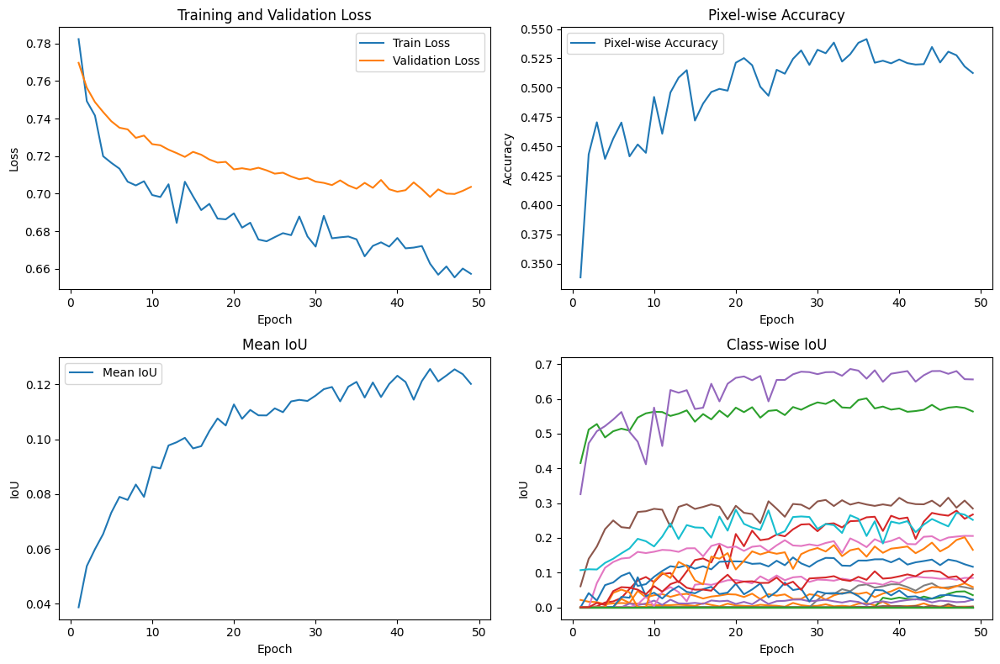

Saving SimpleFCN best model as 'SimpleFCN_best_model.pth'...
Testing SimpleFCN on test-set...
Test Loss: 0.404585887119174
Pixel-wise Accuracy: 0.5130875587463379
Mean IoU: 0.11387407779693604
IoU for class 0: 0.0
IoU for class 1: 0.0026238029822707176
IoU for class 2: 0.5493608117103577
IoU for class 3: 0.3177323639392853
IoU for class 4: 0.5893172025680542
IoU for class 5: 0.31556251645088196
IoU for class 6: 0.08566173911094666
IoU for class 7: 0.03777185454964638
IoU for class 8: 0.0
IoU for class 9: 0.262442022562027
IoU for class 10: 0.17889434099197388
IoU for class 11: 0.04748940467834473
IoU for class 12: 0.02543269284069538
IoU for class 13: 0.0
IoU for class 14: 0.002537722699344158
IoU for class 15: 0.007354205474257469
IoU for class 16: 0.07116278260946274
IoU for class 17: 0.0
IoU for class 18: 0.0
IoU for class 19: 0.0
IoU for class 20: 0.050646595656871796
IoU for class 21: 0.09333135932683945
IoU for class 22: 0.0
IoU for class 23: 0.09565658867359161
Training FPN...


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 1 - Train Loss: 0.7179385795269484, Validation Loss: 0.6979135208659701, Pixel-wise Accuracy: 0.559671507941352, Mean IoU: 0.13106240332126617


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 2 - Train Loss: 0.6297846396028259, Validation Loss: 0.6342678798569573, Pixel-wise Accuracy: 0.6292336781819662, Mean IoU: 0.22212927043437958


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 3 - Train Loss: 0.5846360520816144, Validation Loss: 0.6063133908642663, Pixel-wise Accuracy: 0.6601405673556857, Mean IoU: 0.2532123625278473


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 4 - Train Loss: 0.5554519902776789, Validation Loss: 0.5900924305121104, Pixel-wise Accuracy: 0.6708992852105035, Mean IoU: 0.26981768012046814


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 5 - Train Loss: 0.5282875130205978, Validation Loss: 0.5818231635623508, Pixel-wise Accuracy: 0.6767083273993598, Mean IoU: 0.2806788384914398


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 6 - Train Loss: 0.5392044491973924, Validation Loss: 0.5668414268228743, Pixel-wise Accuracy: 0.6833516226874458, Mean IoU: 0.3026895821094513


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 7 - Train Loss: 0.5116546279118385, Validation Loss: 0.5593234101931254, Pixel-wise Accuracy: 0.6892146004570855, Mean IoU: 0.3109925091266632


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 8 - Train Loss: 0.49137281341317257, Validation Loss: 0.5493422680430942, Pixel-wise Accuracy: 0.6947463353474935, Mean IoU: 0.3209504783153534


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 9 - Train Loss: 0.47959540839548465, Validation Loss: 0.5414109627405802, Pixel-wise Accuracy: 0.7002794477674696, Mean IoU: 0.3281365633010864


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 10 - Train Loss: 0.47600346877251143, Validation Loss: 0.5350093212392595, Pixel-wise Accuracy: 0.7057460149129232, Mean IoU: 0.33715900778770447


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 11 - Train Loss: 0.48010416236924536, Validation Loss: 0.5322586960262723, Pixel-wise Accuracy: 0.7066177792019315, Mean IoU: 0.34137383103370667


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 12 - Train Loss: 0.47667923753644215, Validation Loss: 0.5333262814415826, Pixel-wise Accuracy: 0.7053106096055772, Mean IoU: 0.33884263038635254
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 13 - Train Loss: 0.46138158569365373, Validation Loss: 0.5268333355585734, Pixel-wise Accuracy: 0.7076020770602756, Mean IoU: 0.344345360994339


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 14 - Train Loss: 0.45587245660063663, Validation Loss: 0.5156865153047774, Pixel-wise Accuracy: 0.7173816892835829, Mean IoU: 0.3612854480743408


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 15 - Train Loss: 0.4469815503667902, Validation Loss: 0.508119566573037, Pixel-wise Accuracy: 0.7198451360066732, Mean IoU: 0.3697490990161896


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 16 - Train Loss: 0.42821365374105946, Validation Loss: 0.5052778820196787, Pixel-wise Accuracy: 0.7215584648980035, Mean IoU: 0.37410929799079895


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 17 - Train Loss: 0.42856034452532543, Validation Loss: 0.503463990158505, Pixel-wise Accuracy: 0.7213798099093967, Mean IoU: 0.3717977702617645


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 18 - Train Loss: 0.42919472982118156, Validation Loss: 0.5008954240216149, Pixel-wise Accuracy: 0.7215870751274956, Mean IoU: 0.3742537796497345


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 19 - Train Loss: 0.4393941211847611, Validation Loss: 0.5002753535906473, Pixel-wise Accuracy: 0.7227814992268881, Mean IoU: 0.374948650598526


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 20 - Train Loss: 0.4254631961201444, Validation Loss: 0.4968640175130632, Pixel-wise Accuracy: 0.7266411251491971, Mean IoU: 0.38362550735473633


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 21 - Train Loss: 0.4186536079203641, Validation Loss: 0.4957217209868961, Pixel-wise Accuracy: 0.725565062628852, Mean IoU: 0.3766070604324341


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 22 - Train Loss: 0.41706658587043666, Validation Loss: 0.4930276970068614, Pixel-wise Accuracy: 0.7298955917358398, Mean IoU: 0.3835192024707794


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 23 - Train Loss: 0.41017041033432805, Validation Loss: 0.49659591913223267, Pixel-wise Accuracy: 0.7289681964450412, Mean IoU: 0.38567474484443665
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 24 - Train Loss: 0.4073043366273244, Validation Loss: 0.4924098120795356, Pixel-wise Accuracy: 0.7305213080512153, Mean IoU: 0.3884531557559967


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 25 - Train Loss: 0.40375304994759736, Validation Loss: 0.4920905629793803, Pixel-wise Accuracy: 0.7313545015123155, Mean IoU: 0.38684582710266113


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 26 - Train Loss: 0.40604276881541734, Validation Loss: 0.4877605206436581, Pixel-wise Accuracy: 0.7316349877251519, Mean IoU: 0.39051544666290283


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 27 - Train Loss: 0.3931020321669402, Validation Loss: 0.48702964848942226, Pixel-wise Accuracy: 0.731745613945855, Mean IoU: 0.3904259204864502


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 28 - Train Loss: 0.40072147603388186, Validation Loss: 0.4847395122051239, Pixel-wise Accuracy: 0.7355856365627713, Mean IoU: 0.3933340311050415


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 29 - Train Loss: 0.39108932202244984, Validation Loss: 0.4867853025595347, Pixel-wise Accuracy: 0.735566775004069, Mean IoU: 0.392915815114975
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 30 - Train Loss: 0.39823160458494117, Validation Loss: 0.48569191495577496, Pixel-wise Accuracy: 0.7344829771253798, Mean IoU: 0.39418792724609375
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 31 - Train Loss: 0.39734754904552744, Validation Loss: 0.4847557246685028, Pixel-wise Accuracy: 0.7347384558783637, Mean IoU: 0.3967793881893158
Validation loss has not improved for 3 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 32 - Train Loss: 0.36744278687753795, Validation Loss: 0.4824345178074307, Pixel-wise Accuracy: 0.7364756266276041, Mean IoU: 0.3972328007221222


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 33 - Train Loss: 0.382371954527902, Validation Loss: 0.48353516393237644, Pixel-wise Accuracy: 0.7349716822306315, Mean IoU: 0.39280930161476135
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 34 - Train Loss: 0.3989688266574601, Validation Loss: 0.48141463928752476, Pixel-wise Accuracy: 0.7348927391899956, Mean IoU: 0.39451050758361816


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 35 - Train Loss: 0.378324857832473, Validation Loss: 0.4814608030849033, Pixel-wise Accuracy: 0.7371683120727539, Mean IoU: 0.39959296584129333
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 36 - Train Loss: 0.3693161842263775, Validation Loss: 0.4797493517398834, Pixel-wise Accuracy: 0.7374325858222114, Mean IoU: 0.39996954798698425


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 37 - Train Loss: 0.38635224950166397, Validation Loss: 0.4775447944800059, Pixel-wise Accuracy: 0.7372794681125217, Mean IoU: 0.39946115016937256


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 38 - Train Loss: 0.3817423580237377, Validation Loss: 0.466226942009396, Pixel-wise Accuracy: 0.7465942170884874, Mean IoU: 0.41526496410369873


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 39 - Train Loss: 0.365733798455309, Validation Loss: 0.4632395539018843, Pixel-wise Accuracy: 0.7501441107855903, Mean IoU: 0.4216483533382416


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 40 - Train Loss: 0.368685065412227, Validation Loss: 0.4560356338818868, Pixel-wise Accuracy: 0.7508111529880099, Mean IoU: 0.42332136631011963


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 41 - Train Loss: 0.3600653192879241, Validation Loss: 0.462255855401357, Pixel-wise Accuracy: 0.7480288611518012, Mean IoU: 0.4196428954601288
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 42 - Train Loss: 0.36025156062326313, Validation Loss: 0.45532703068521285, Pixel-wise Accuracy: 0.7499577204386393, Mean IoU: 0.42295655608177185


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 43 - Train Loss: 0.35760787313367115, Validation Loss: 0.4601519637637668, Pixel-wise Accuracy: 0.7487543953789605, Mean IoU: 0.4183802902698517
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 44 - Train Loss: 0.3509591519832611, Validation Loss: 0.4537407226032681, Pixel-wise Accuracy: 0.7525162167019315, Mean IoU: 0.42740628123283386


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 45 - Train Loss: 0.36028188007113376, Validation Loss: 0.45503565006785923, Pixel-wise Accuracy: 0.7525555292765299, Mean IoU: 0.42847517132759094
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 46 - Train Loss: 0.349400187716072, Validation Loss: 0.45464860068427193, Pixel-wise Accuracy: 0.7506801817152235, Mean IoU: 0.423988938331604
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 47 - Train Loss: 0.3483842798957118, Validation Loss: 0.45174646708700394, Pixel-wise Accuracy: 0.7544989056057401, Mean IoU: 0.42897364497184753


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 48 - Train Loss: 0.3599630618168984, Validation Loss: 0.44940386878119576, Pixel-wise Accuracy: 0.7560504277547201, Mean IoU: 0.43214258551597595


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 49 - Train Loss: 0.34328910101343085, Validation Loss: 0.45179757475852966, Pixel-wise Accuracy: 0.7542449103461372, Mean IoU: 0.42507460713386536
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 50 - Train Loss: 0.3504769809452104, Validation Loss: 0.4546083112557729, Pixel-wise Accuracy: 0.753694110446506, Mean IoU: 0.426127552986145
Validation loss has not improved for 2 epochs


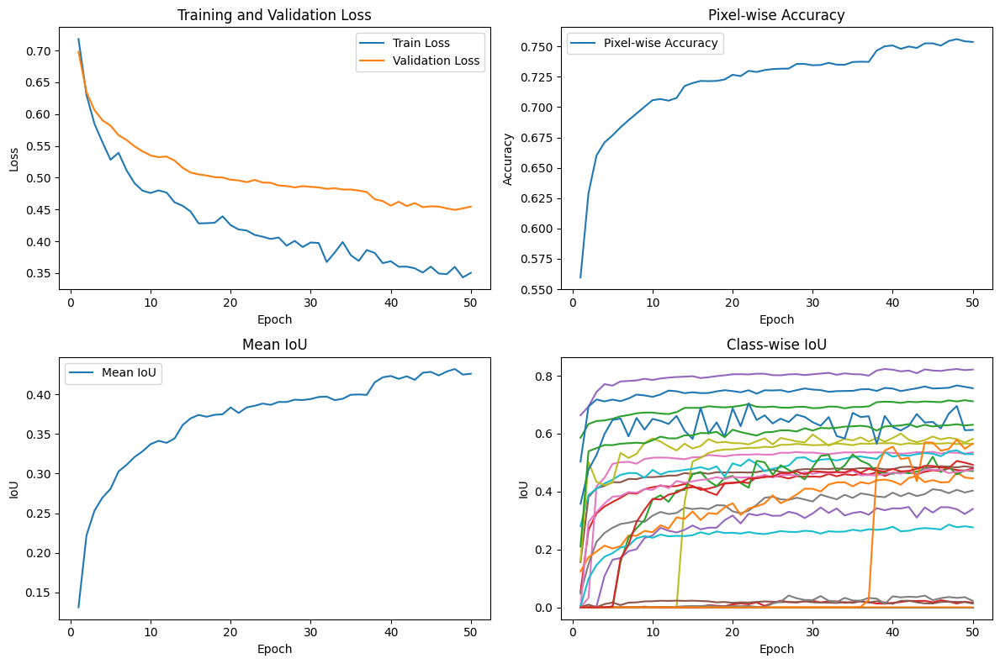

Saving FPN best model as 'FPN_best_model.pth'...
Testing FPN on test-set...
Test Loss: 0.25513803362846377
Pixel-wise Accuracy: 0.7556529998779297
Mean IoU: 0.4873158037662506
IoU for class 0: 0.0
IoU for class 1: 1.2419236554706004e-05
IoU for class 2: 0.7008869051933289
IoU for class 3: 0.5649992227554321
IoU for class 4: 0.6184409856796265
IoU for class 5: 0.5396826267242432
IoU for class 6: 0.8671101927757263
IoU for class 7: 0.47772133350372314
IoU for class 8: 0.5090892314910889
IoU for class 9: 0.4961901009082794
IoU for class 10: 0.722317099571228
IoU for class 11: 0.5268484354019165
IoU for class 12: 0.569166362285614
IoU for class 13: 0.0
IoU for class 14: 0.29618820548057556
IoU for class 15: 0.09579245001077652
IoU for class 16: 0.5724983811378479
IoU for class 17: 0.559907078742981
IoU for class 18: 0.9078218936920166
IoU for class 19: 0.29522156715393066
IoU for class 20: 0.4950268566608429
IoU for class 21: 0.5227741003036499
IoU for class 22: 0.8089413642883301
IoU for 

  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 1 - Train Loss: 0.7650217336637003, Validation Loss: 0.7481301228205363, Pixel-wise Accuracy: 0.36658594343397355, Mean IoU: 0.07053447514772415


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 2 - Train Loss: 0.6991616160045435, Validation Loss: 0.7114142510626051, Pixel-wise Accuracy: 0.5656091901991103, Mean IoU: 0.10932696610689163


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 3 - Train Loss: 0.682399328108187, Validation Loss: 0.6957379115952386, Pixel-wise Accuracy: 0.5939717822604709, Mean IoU: 0.1326591819524765


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 4 - Train Loss: 0.6545856179278574, Validation Loss: 0.676120294464959, Pixel-wise Accuracy: 0.6071763568454318, Mean IoU: 0.1625509113073349


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 5 - Train Loss: 0.6248742514922295, Validation Loss: 0.6533996595276726, Pixel-wise Accuracy: 0.6380558013916016, Mean IoU: 0.19062690436840057


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 6 - Train Loss: 0.5978522065245075, Validation Loss: 0.6284695400132073, Pixel-wise Accuracy: 0.6653095881144205, Mean IoU: 0.23972992599010468


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 7 - Train Loss: 0.5787784736833455, Validation Loss: 0.6057340105374655, Pixel-wise Accuracy: 0.6755753623114692, Mean IoU: 0.25900799036026


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 8 - Train Loss: 0.557067409341718, Validation Loss: 0.5786216987503899, Pixel-wise Accuracy: 0.6982941097683377, Mean IoU: 0.28903478384017944


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 9 - Train Loss: 0.5459697643915812, Validation Loss: 0.5627119772964053, Pixel-wise Accuracy: 0.7039049996270074, Mean IoU: 0.31438812613487244


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 10 - Train Loss: 0.5154122702869368, Validation Loss: 0.5549131598737505, Pixel-wise Accuracy: 0.7067713207668729, Mean IoU: 0.33302298188209534


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 11 - Train Loss: 0.5087847860507023, Validation Loss: 0.5432219405968984, Pixel-wise Accuracy: 0.7127549913194444, Mean IoU: 0.3431958258152008


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 12 - Train Loss: 0.5108848306131951, Validation Loss: 0.5328439937697517, Pixel-wise Accuracy: 0.7167064878675673, Mean IoU: 0.3564123809337616


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 13 - Train Loss: 0.4799051777816113, Validation Loss: 0.5302632186147902, Pixel-wise Accuracy: 0.7153998480902778, Mean IoU: 0.3508852422237396


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 14 - Train Loss: 0.4809763059939867, Validation Loss: 0.52231165766716, Pixel-wise Accuracy: 0.7198426988389757, Mean IoU: 0.3620370924472809


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 15 - Train Loss: 0.47453762572488667, Validation Loss: 0.5169761843151517, Pixel-wise Accuracy: 0.7239867316351997, Mean IoU: 0.37089213728904724


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 16 - Train Loss: 0.44648025396429464, Validation Loss: 0.5088275108072493, Pixel-wise Accuracy: 0.727108531528049, Mean IoU: 0.3790092468261719


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 17 - Train Loss: 0.4555509660714938, Validation Loss: 0.5076274673144022, Pixel-wise Accuracy: 0.7278469933403863, Mean IoU: 0.3775174915790558


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 18 - Train Loss: 0.4361385938561993, Validation Loss: 0.5052618616157107, Pixel-wise Accuracy: 0.7287922965155708, Mean IoU: 0.383001446723938


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 19 - Train Loss: 0.4483211507767807, Validation Loss: 0.49425001276863945, Pixel-wise Accuracy: 0.7350453270806206, Mean IoU: 0.390093058347702


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 20 - Train Loss: 0.43595525953504777, Validation Loss: 0.49447573886977303, Pixel-wise Accuracy: 0.7337233225504557, Mean IoU: 0.39389145374298096
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 21 - Train Loss: 0.4492863379878762, Validation Loss: 0.4925242563088735, Pixel-wise Accuracy: 0.7374413808186849, Mean IoU: 0.39949557185173035


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 22 - Train Loss: 0.4249641538402181, Validation Loss: 0.48752591013908386, Pixel-wise Accuracy: 0.7362074322170682, Mean IoU: 0.3955329954624176


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 23 - Train Loss: 0.4311448802918564, Validation Loss: 0.4844309422704909, Pixel-wise Accuracy: 0.7400235070122613, Mean IoU: 0.402630478143692


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 24 - Train Loss: 0.4004810158117318, Validation Loss: 0.486871341864268, Pixel-wise Accuracy: 0.7383627361721463, Mean IoU: 0.39818188548088074
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 25 - Train Loss: 0.4207733692946257, Validation Loss: 0.4828854865498013, Pixel-wise Accuracy: 0.7402319378323026, Mean IoU: 0.4012112319469452


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 26 - Train Loss: 0.41869192358888224, Validation Loss: 0.48087665769788956, Pixel-wise Accuracy: 0.7416641447279189, Mean IoU: 0.4039964973926544


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 27 - Train Loss: 0.4137065182497472, Validation Loss: 0.47721074355973137, Pixel-wise Accuracy: 0.7435842090182834, Mean IoU: 0.40585967898368835


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 28 - Train Loss: 0.3986305999167172, Validation Loss: 0.478451712263955, Pixel-wise Accuracy: 0.7432531780666776, Mean IoU: 0.4056614339351654
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 29 - Train Loss: 0.4097446427669054, Validation Loss: 0.47910911175939774, Pixel-wise Accuracy: 0.7434813181559244, Mean IoU: 0.40979132056236267
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 30 - Train Loss: 0.39171776451446394, Validation Loss: 0.4793904821077983, Pixel-wise Accuracy: 0.7425065570407443, Mean IoU: 0.40633425116539
Validation loss has not improved for 3 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 31 - Train Loss: 0.40628467150676395, Validation Loss: 0.47809988260269165, Pixel-wise Accuracy: 0.7436907026502821, Mean IoU: 0.4068789780139923
Validation loss has not improved for 4 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 32 - Train Loss: 0.39707731464762747, Validation Loss: 0.4758024646176232, Pixel-wise Accuracy: 0.7421151267157661, Mean IoU: 0.4081343114376068


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 33 - Train Loss: 0.397031639829094, Validation Loss: 0.4712714023060269, Pixel-wise Accuracy: 0.7462339401245117, Mean IoU: 0.4144136607646942


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 34 - Train Loss: 0.3997785333130095, Validation Loss: 0.4726691312260098, Pixel-wise Accuracy: 0.7450003094143338, Mean IoU: 0.4135229289531708
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 35 - Train Loss: 0.3938689173003774, Validation Loss: 0.4737919867038727, Pixel-wise Accuracy: 0.7448836432562934, Mean IoU: 0.41296637058258057
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 36 - Train Loss: 0.38355973749249067, Validation Loss: 0.4700834916697608, Pixel-wise Accuracy: 0.7473581102159288, Mean IoU: 0.4122939109802246


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 37 - Train Loss: 0.37765056262781593, Validation Loss: 0.47436558538013035, Pixel-wise Accuracy: 0.7430553436279297, Mean IoU: 0.4081524610519409
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 38 - Train Loss: 0.36060810181093805, Validation Loss: 0.4671953055593703, Pixel-wise Accuracy: 0.7478934393988715, Mean IoU: 0.4164159297943115


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 39 - Train Loss: 0.38688555507012357, Validation Loss: 0.46805404954486424, Pixel-wise Accuracy: 0.7443256378173828, Mean IoU: 0.411606103181839
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 40 - Train Loss: 0.38597371530385666, Validation Loss: 0.46592052115334404, Pixel-wise Accuracy: 0.7484039730495877, Mean IoU: 0.41666969656944275


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 41 - Train Loss: 0.37958876972581135, Validation Loss: 0.46419642368952435, Pixel-wise Accuracy: 0.7480643590291342, Mean IoU: 0.4186941087245941


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 42 - Train Loss: 0.377817201209657, Validation Loss: 0.46017876267433167, Pixel-wise Accuracy: 0.7526360617743598, Mean IoU: 0.4248291552066803


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 43 - Train Loss: 0.37250564716480394, Validation Loss: 0.4675881465276082, Pixel-wise Accuracy: 0.7461840311686198, Mean IoU: 0.4121699333190918
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 44 - Train Loss: 0.37701317263238227, Validation Loss: 0.46277180645200944, Pixel-wise Accuracy: 0.748406622144911, Mean IoU: 0.41887155175209045
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 45 - Train Loss: 0.37580130718372484, Validation Loss: 0.46460241741604275, Pixel-wise Accuracy: 0.7483053207397461, Mean IoU: 0.41666170954704285
Validation loss has not improved for 3 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 46 - Train Loss: 0.369683693036621, Validation Loss: 0.4629734257857005, Pixel-wise Accuracy: 0.7480041715833876, Mean IoU: 0.4187014400959015
Validation loss has not improved for 4 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 47 - Train Loss: 0.3671244125307342, Validation Loss: 0.45593588882022434, Pixel-wise Accuracy: 0.7529691060384115, Mean IoU: 0.42916297912597656


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 48 - Train Loss: 0.35780508779449227, Validation Loss: 0.45777176154984367, Pixel-wise Accuracy: 0.7526268429226346, Mean IoU: 0.42515191435813904
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 49 - Train Loss: 0.35473101282561265, Validation Loss: 0.45932063460350037, Pixel-wise Accuracy: 0.7523237864176432, Mean IoU: 0.4232178032398224
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 50 - Train Loss: 0.36382560560732713, Validation Loss: 0.4628400372134315, Pixel-wise Accuracy: 0.7518310546875, Mean IoU: 0.42311039566993713
Validation loss has not improved for 3 epochs


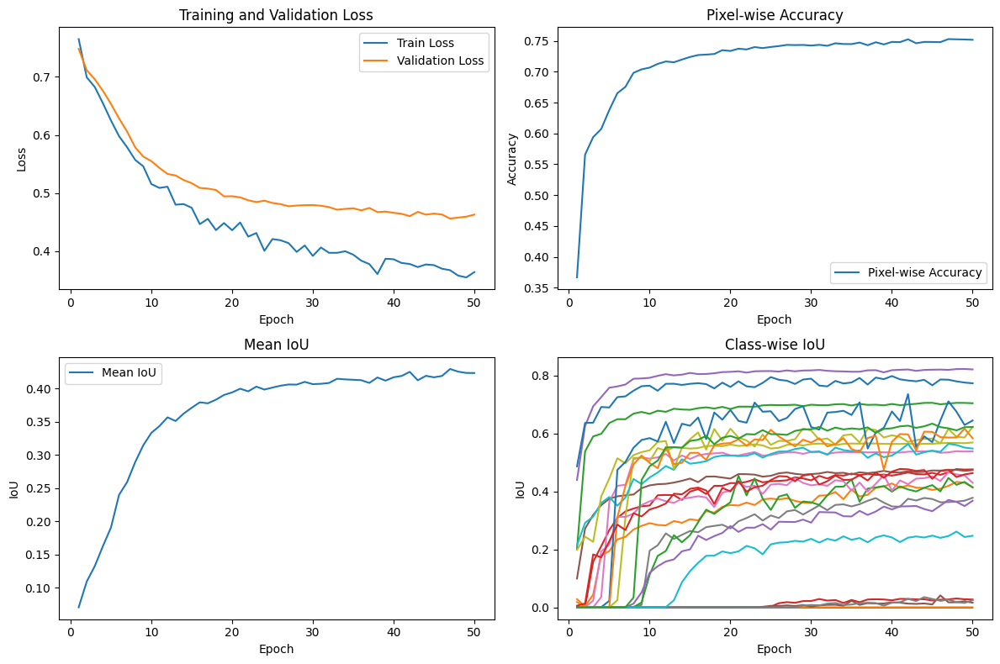

Saving DeepLabV3Plus best model as 'DeepLabV3Plus_best_model.pth'...
Testing DeepLabV3Plus on test-set...
Test Loss: 0.26401014514267446
Pixel-wise Accuracy: 0.750554370880127
Mean IoU: 0.4804820120334625
IoU for class 0: 0.0
IoU for class 1: 0.00011173843085998669
IoU for class 2: 0.694582998752594
IoU for class 3: 0.49583205580711365
IoU for class 4: 0.6200847029685974
IoU for class 5: 0.5367133021354675
IoU for class 6: 0.8918484449386597
IoU for class 7: 0.5003104209899902
IoU for class 8: 0.5481346249580383
IoU for class 9: 0.47424647212028503
IoU for class 10: 0.7221343517303467
IoU for class 11: 0.5363247394561768
IoU for class 12: 0.510880708694458
IoU for class 13: 0.0
IoU for class 14: 0.21316245198249817
IoU for class 15: 0.07510333508253098
IoU for class 16: 0.5356314182281494
IoU for class 17: 0.6086956262588501
IoU for class 18: 0.9144502282142639
IoU for class 19: 0.2814491093158722
IoU for class 20: 0.48540806770324707
IoU for class 21: 0.5428658723831177
IoU for class 

In [51]:
# Clear cache and collect garbage
torch.cuda.empty_cache()
gc.collect()

# Dictionary to store the results
model_results = {}

# Training loop for each model
for model_name, model in models.items():
    print(f"Training {model_name}...")

    # If using DataParallel use all the available GPUs
    model = nn.DataParallel(model)
    model.to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))
    
    epochs = 50
    lr = 0.0001
    patience = 5

    trainer = Trainer(model, train_dataloader, val_dataloader, test_dataloader, lr=lr, patience=patience)
    trainer.train(epochs)

    # Save the best model
    print(f"Saving {model_name} best model as '{model_name}_best_model.pth'...")
    torch.save(trainer.best_model_state, f"{model_name}_best_model.pth")

    # Test the model
    print(f"Testing {model_name} on test-set...")
    test_loss, test_pixel_acc, test_mean_iou, class_iou = trainer.test()

    # Store the results
    model_results[model_name] = {
        'test_loss': test_loss,
        'test_pixel_acc': test_pixel_acc,
        'test_mean_iou': test_mean_iou,
        'class_iou': class_iou,
        'epochs': epochs,
        'lr': lr,
        'patience': patience,
    }

print("All models trained, tested, and evaluated.")

In [54]:
import csv
# Clear cache and collect garbage
torch.cuda.empty_cache()
gc.collect()

# Dictionary to store the results
model_results = {}

# Load and test the models from disk
for model_name, model in models.items():
    print(f"Loading {model_name} best model from '{model_name}_best_model.pth'...")

    # If using DataParallel use all the available GPUs
    model = nn.DataParallel(model)
    model.to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))
    
    # Load the saved model state
    model.load_state_dict(torch.load(f"{model_name}_best_model.pth"))
    
    # Initialize a new trainer for testing
    trainer = Trainer(model, train_dataloader, val_dataloader, test_dataloader, lr=0.0001, patience=5)
    
    # Test the model
    print(f"Testing {model_name} on test-set...")
    test_loss, test_pixel_acc, test_mean_iou, class_iou = trainer.test()

    # Store the results
    model_results[model_name] = {
        'test_loss': test_loss,
        'test_pixel_acc': test_pixel_acc,
        'test_mean_iou': test_mean_iou,
        'class_iou': class_iou,
        'epochs': 25,
        'lr': 0.0001,
        'patience': 5,
    }

print("All models loaded, tested, and evaluated.")

print()

# Print the results for each model
for model_name, results in model_results.items():
    print(f"Results for {model_name}:")
    print(f"Test Loss: {results['test_loss']}")
    print(f"Test Pixel Accuracy: {results['test_pixel_acc']}")
    print(f"Test Mean IoU: {results['test_mean_iou']}")
    # print(f"Class IoU: {results['class_iou']}")
    

# Append results to the file "results.csv"
csv_file = 'results.csv'
file_exists = os.path.isfile(csv_file)

with open(csv_file, 'a', newline='') as file:
    writer = csv.writer(file)
    if not file_exists:
        writer.writerow(['Model', 'Test Loss', 'Test Pixel Accuracy', 'Test Mean IoU', 'Epochs', 'Learning Rate'])
    for model_name, results in model_results.items():
        writer.writerow([model_name, results['test_loss'], results['test_pixel_acc'], results['test_mean_iou'], results['epochs'], results['lr']])

# Sorting models by Mean IoU
sorted_models = sorted(model_results.items(), key=lambda item: item[1]['test_mean_iou'], reverse=True)

print()
print("Models ranked by Mean IoU (descending):\n")
for model_name, results in sorted_models:
    print(f"- {model_name}: {results['test_mean_iou']}")

# Sorting models by Pixel Accuracy
sorted_models = sorted(model_results.items(), key=lambda item: item[1]['test_pixel_acc'], reverse=True)

print()
print("Models ranked by Pixel Accuracy (descending):\n")
for model_name, results in sorted_models:
    print(f"- {model_name}: {results['test_pixel_acc']}")

Loading SimpleFCN best model from 'SimpleFCN_best_model.pth'...
Testing SimpleFCN on test-set...
Test Loss: 0.404585887119174
Pixel-wise Accuracy: 0.5130875587463379
Mean IoU: 0.11387407779693604
IoU for class 0: 0.0
IoU for class 1: 0.0026238029822707176
IoU for class 2: 0.5493608117103577
IoU for class 3: 0.3177323639392853
IoU for class 4: 0.5893172025680542
IoU for class 5: 0.31556251645088196
IoU for class 6: 0.08566173911094666
IoU for class 7: 0.03777185454964638
IoU for class 8: 0.0
IoU for class 9: 0.262442022562027
IoU for class 10: 0.17889434099197388
IoU for class 11: 0.04748940467834473
IoU for class 12: 0.02543269284069538
IoU for class 13: 0.0
IoU for class 14: 0.002537722699344158
IoU for class 15: 0.007354205474257469
IoU for class 16: 0.07116278260946274
IoU for class 17: 0.0
IoU for class 18: 0.0
IoU for class 19: 0.0
IoU for class 20: 0.050646595656871796
IoU for class 21: 0.09333135932683945
IoU for class 22: 0.0
IoU for class 23: 0.09565658867359161
Loading FPN be

# Model Evaluation

In this section, we will evaluate the trained models on the test set.

## Visual evaluation of produced masks

Evaluating SimpleFCN...


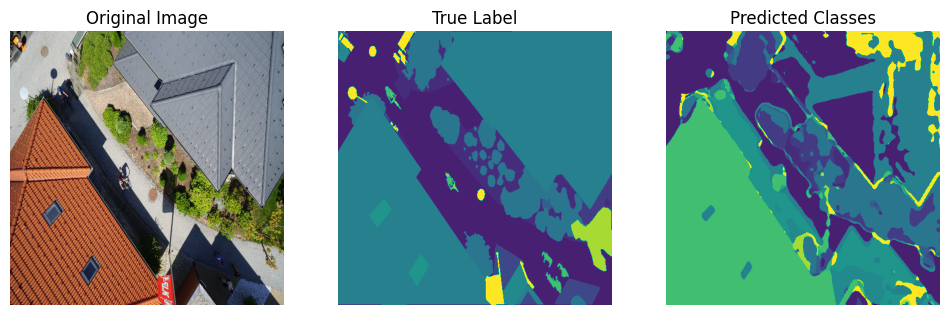

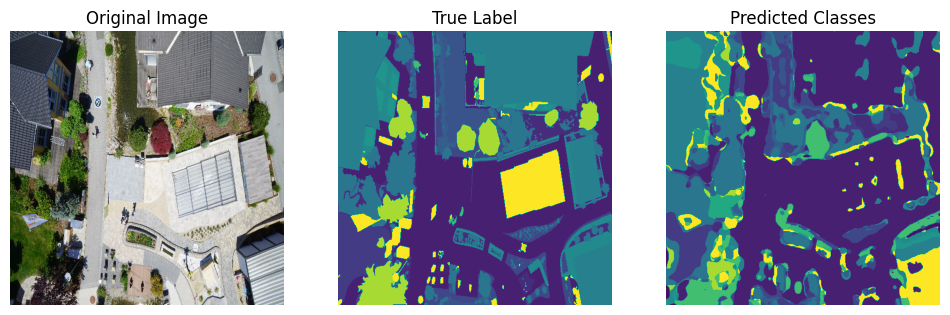

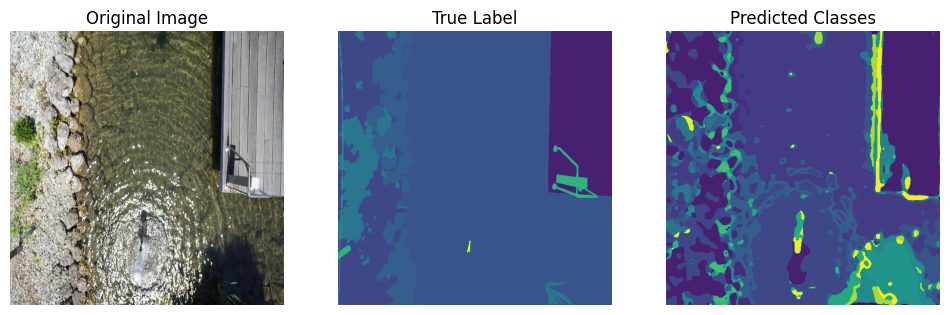

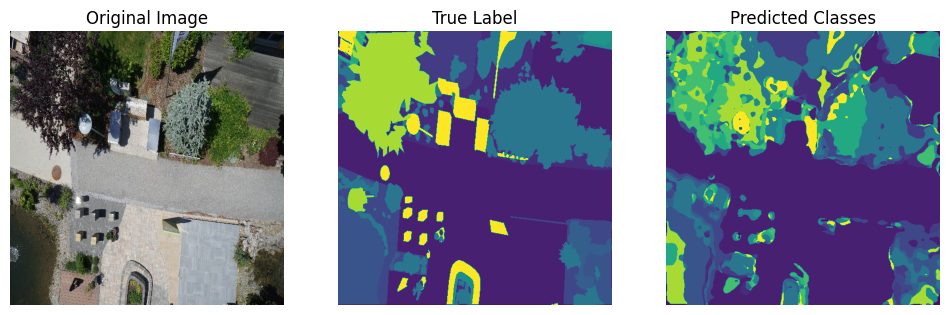

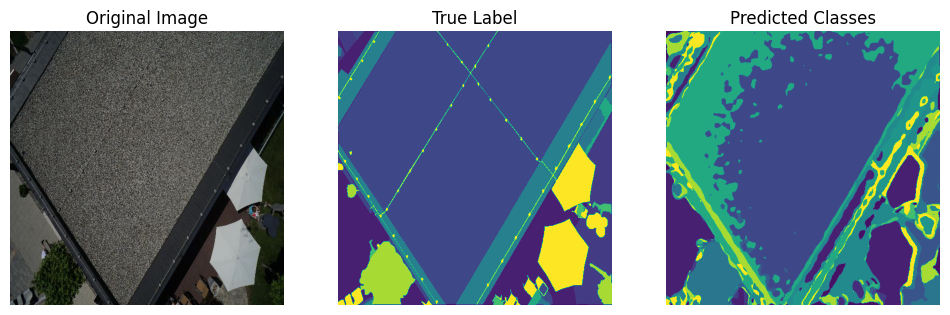

Evaluating FPN...


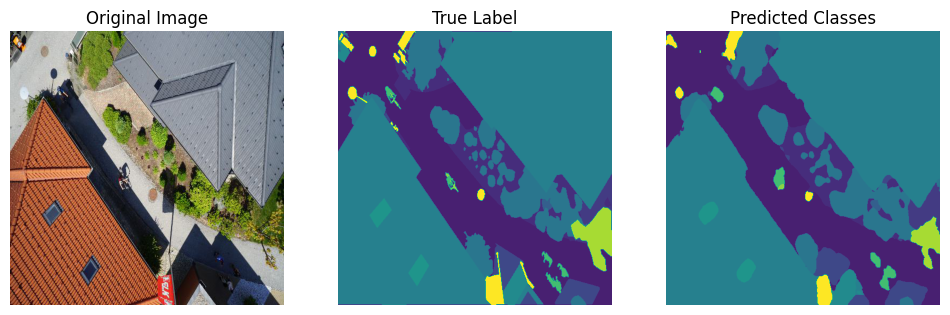

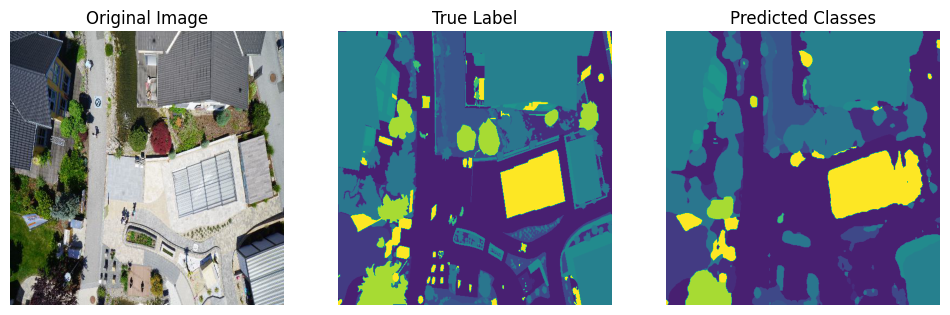

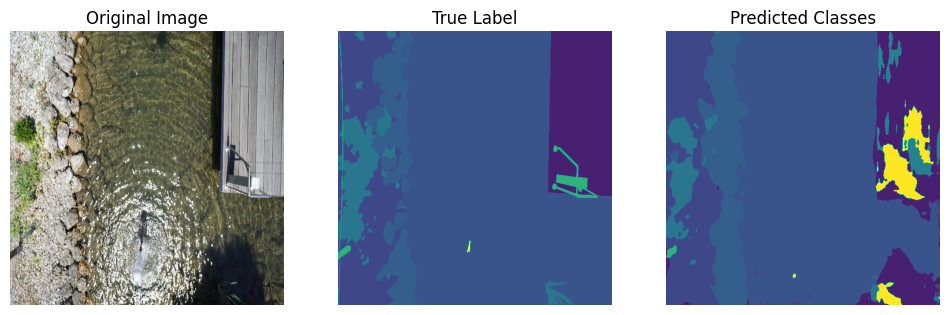

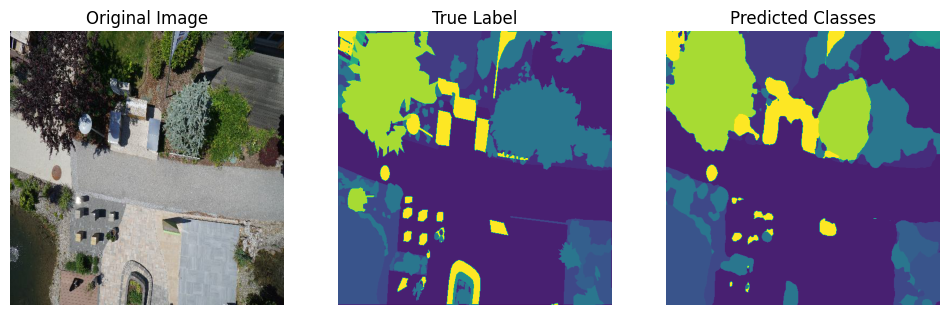

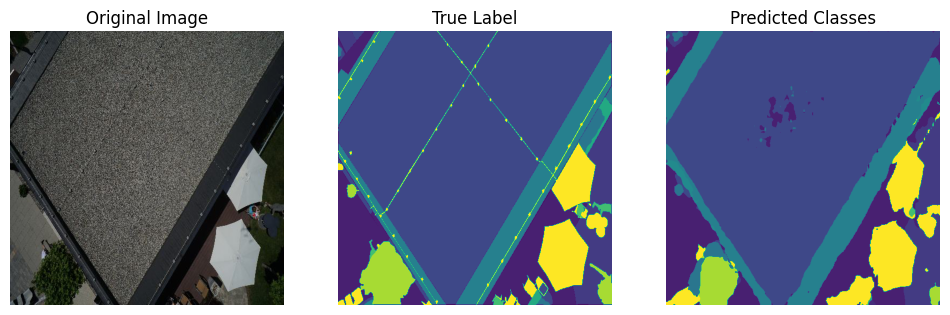

Evaluating DeepLabV3Plus...


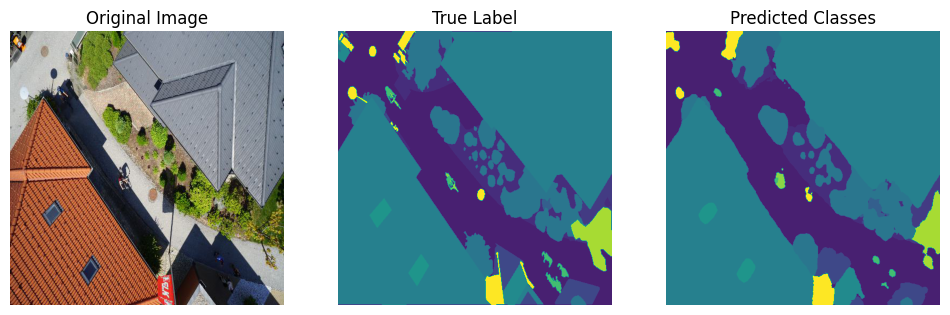

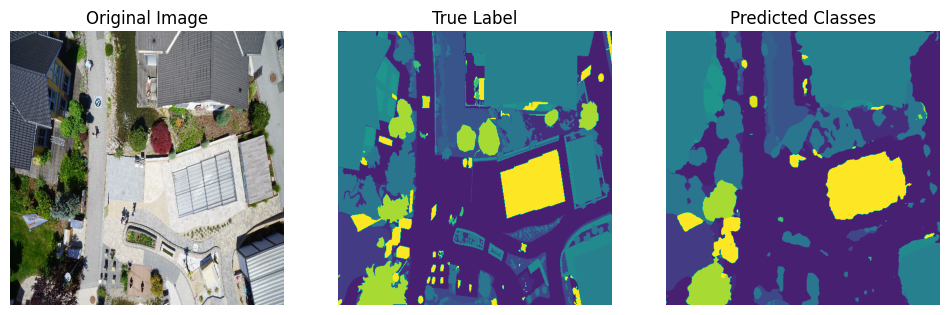

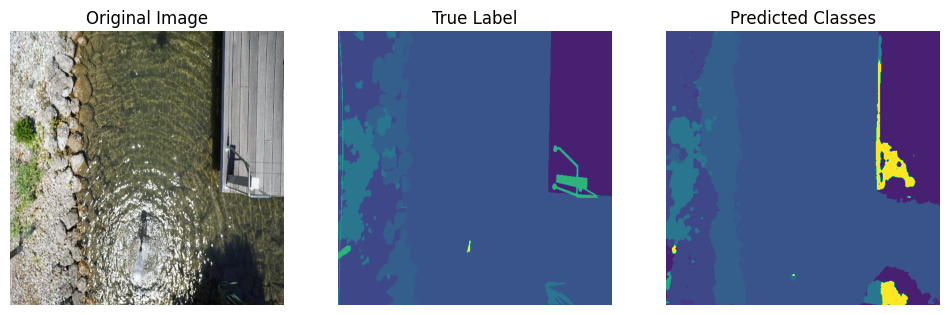

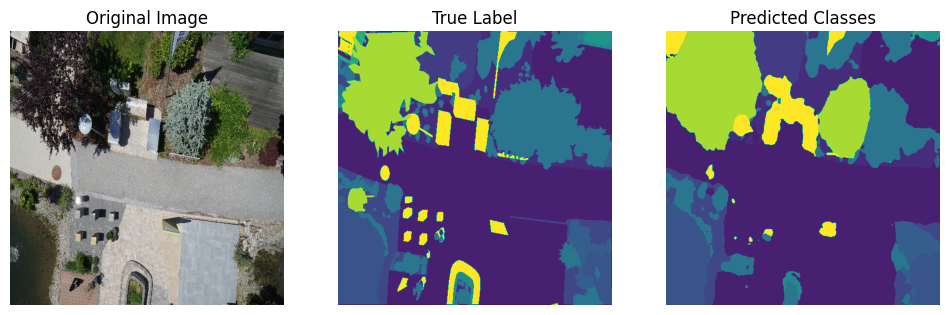

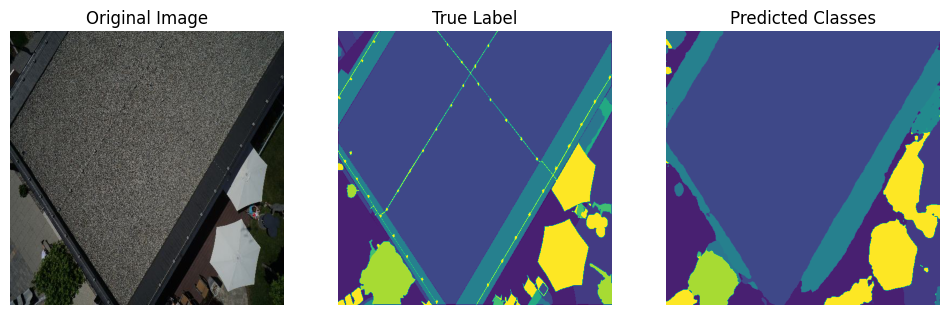

In [55]:
def evaluate_saved_models(models, test_dataloader, device, mean, std, num_images = 2):
    for model_name, model_class in models.items():
        print(f"Evaluating {model_name}...")

        # Initialize the model architecture
        model = model_class

        # Use all the available GPUs
        model = nn.DataParallel(model)
        model.to(device)

        # Load the saved model state
        checkpoint = torch.load(f"{model_name}_best_model.pth")
        model.load_state_dict(checkpoint)

        model.eval()
        with torch.no_grad():
            for i, (images, labels) in enumerate(test_dataloader):
                images = images.to(device)
                labels = labels.to(device).long().squeeze(1)

                outputs = model(images)
                probabilities = torch.nn.functional.softmax(outputs, dim=1)
                predicted_classes = torch.argmax(probabilities, dim=1)

                plt.figure(figsize=(12, 8))

                # Display original image
                plt.subplot(1, 3, 1)
                image_denormalized = denormalize_image(images[0].permute(1, 2, 0).cpu(), mean, std)
                plt.imshow(image_denormalized)
                plt.title('Original Image')
                plt.axis('off')

                # Display true label
                plt.subplot(1, 3, 2)
                plt.imshow(labels[0].cpu().numpy(), vmin=0, vmax=23)
                plt.title('True Label')
                plt.axis('off')

                # Display predicted classes
                plt.subplot(1, 3, 3)
                plt.imshow(predicted_classes[0].cpu().numpy(), vmin=0, vmax=23)
                plt.title('Predicted Classes')
                plt.axis('off')

                plt.show()

                if i == num_images - 1:
                    break

        # Clear cache and collect garbage
        torch.cuda.empty_cache()
        gc.collect()

evaluate_saved_models(models, test_dataloader, device, mean, std, num_images = 5)

## Gradio GUI

In [ ]:
from torchvision import transforms
from torch import nn

# Load the saved model weights
def load_model_weights(model, model_name):
    # Load the state dict
    state_dict = torch.load(f"{model_name}_best_model.pth", map_location=torch.device('cpu'))

    # Remove the 'module.' prefix if present
    new_state_dict = {}
    for key, value in state_dict.items():
        if key.startswith("module."):
            new_state_dict[key[7:]] = value  # remove 'module.' prefix
        else:
            new_state_dict[key] = value

    # Load the new state dict into the model
    model.load_state_dict(new_state_dict)

# Load saved model weights with CPU mapping if CUDA is not available
for model_name in models:
    load_model_weights(models[model_name], model_name)
    models[model_name] = models[model_name].eval().to(device)

# Define the function to segment an image
def segment_image(image, model_name):
    # Preprocess the image
    image = Image.fromarray(image).convert("RGB")
    transform = transforms.Compose([
        transforms.Resize((512, 512)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_image = transform(image).unsqueeze(0).to(device)

    # Select the model
    model = models[model_name].to(device)

    # Perform inference
    with torch.no_grad():
        output = model(input_image)

    # Process the output
    output = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

    # Normalize output for visualization
    output = (output - np.min(output)) / (np.max(output) - np.min(output))
    output = (output * 255).astype(np.uint8)

    return output

# Define the Gradio interface
image_input = gr.components.Image(type="numpy", label="Input Image")
model_input = gr.components.Dropdown(choices=list(models.keys()), label="Model")
output_image = gr.components.Image(type="numpy", label="Segmented Image")

# Create the Gradio interface
gr_interface = gr.Interface(
    fn=segment_image,
    inputs=[image_input, model_input],
    outputs=output_image,
    title="Semantic Segmentation",
    description="Upload an image and select a model to get the semantic segmentation."
)

# Launch the Gradio interface
gr_interface.launch(share=True)